In [2]:
import pandas as pd 
import plotly.express as px
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


df_original = pd.read_csv("train.csv")
df = df_original
df

,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,fffe4300490044003600300030003800,Pattie Morrisey,18,F,XW0DQ7H,Village,Platinum Membership,2017-08-17,No,xxxxxxxx,...,300.630000,53005.25,17.0,781.750000,Yes,Yes,No,Not Applicable,Products always in Stock,2
1,fffe43004900440032003100300035003700,Traci Peery,32,F,5K0N3X1,City,Premium Membership,2017-08-28,?,CID21329,...,306.340000,12838.38,10.0,NaN,Yes,No,Yes,Solved,Quality Customer Care,1
2,fffe4300490044003100390032003600,Merideth Mcmeen,44,F,1F2TCL3,Town,No Membership,2016-11-11,Yes,CID12313,...,516.160000,21027.00,22.0,500.690000,No,Yes,Yes,Solved in Follow-up,Poor Website,5
3,fffe43004900440036003000330031003600,Eufemia Cardwell,37,M,VJGJ33N,City,No Membership,2016-10-29,Yes,CID3793,...,53.270000,25239.56,6.0,567.660000,No,Yes,Yes,Unsolved,Poor Website,5
4,fffe43004900440031003900350030003600,Meghan Kosak,31,F,SVZXCWB,City,No Membership,2017-09-12,No,xxxxxxxx,...,113.130000,24483.66,16.0,663.060000,No,Yes,Yes,Solved,Poor Website,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,fffe43004900440035003500390036003100,Cuc Tarr,46,F,6F51HFO,NaN,Basic Membership,2017-09-21,No,xxxxxxxx,...,-650.682759,27277.68,6.0,639.510000,No,Yes,Yes,No Information Available,No reason specified,4
36988,fffe43004900440033003500380036003600,Jenni Stronach,29,F,21KSM8Y,Town,Basic Membership,2016-06-27,No,xxxxxxxx,...,-638.123421,11069.71,28.0,527.990000,Yes,No,No,Not Applicable,Poor Customer Service,5
36989,fffe4300490044003500330034003100,Luciana Kinch,23,F,XK1IM9H,NaN,Basic Membership,2016-09-11,Yes,CID3838,...,154.940000,38127.56,Error,680.470000,No,Yes,Yes,Unsolved,Poor Website,4
36990,fffe43004900440031003200390039003000,Tawana Ardoin,53,M,K6VTP1Z,Village,Platinum Membership,2017-06-15,No,xxxxxxxx,...,482.610000,2378.86,20.0,197.264414,Yes,Yes,No,Not Applicable,No reason specified,3


In [3]:
'''def discover_categorical_and_numerical(df):
  type_dictionary = {col: ("categorical" if df[col].dtype == "O" else "numerical") for col in df.columns}
  categorical = [key for key, val in type_dictionary.items() if val == "categorical"]
  numerical = df.columns.difference(categorical)
  return categorical, numerical'''

'def discover_categorical_and_numerical(df):\n  type_dictionary = {col: ("categorical" if df[col].dtype == "O" else "numerical") for col in df.columns}\n  categorical = [key for key, val in type_dictionary.items() if val == "categorical"]\n  numerical = df.columns.difference(categorical)\n  return categorical, numerical'

In [4]:
'''categorical, numerical = discover_categorical_and_numerical(df)'''

'categorical, numerical = discover_categorical_and_numerical(df)'

In [5]:
churn_avg_time_box = px.box(df,y = "avg_time_spent", x = "churn_risk_score")
churn_avg_time_box.show()

#average time spent on the website is about the same across all risk scores, variability varies more with those who have higher churn risk score. Negative avg time spent values. 

In [5]:
df_simplified = df 
df_simplified = df_simplified.filter(items = ['complaint_status','churn_risk_score'])
df_simplified["count"] = df_simplified.groupby(["complaint_status","churn_risk_score"]).transform('size')

bc = px.histogram(df_simplified, x = "churn_risk_score", facet_col = "complaint_status",histnorm="percent")
bc.show()

#Whether or not a user's complaint_status was positive or negative, it doesn't affect whether or not the user's churn score was high 


In [6]:
feedback_histogram = px.histogram(df, x = "feedback", facet_col = "churn_risk_score")
feedback_histogram.show()

In [7]:
churn_avg_spend_box = px.box(df, y = "avg_transaction_value", x = "churn_risk_score")
churn_avg_spend_box.show()

#People who're spending more on the website have lower churn risk scores 

In [8]:
histogram_ages = px.histogram(df,x = "age", facet_col = "region_category", histnorm="percent")
histogram_ages.show()

#age is approximately uniformly distributed, region doesn't affect whose on the website 
#weird nan values to fix later 

In [9]:
df_mod = df
df_mod["churn_risk_score"] = df_mod["churn_risk_score"].astype("string")
scatter_time_value = px.scatter(df,x = "avg_time_spent", y = "avg_transaction_value", color = "churn_risk_score", facet_col = "membership_category")
scatter_time_value.for_each_annotation(lambda a: a.update(text = a.text.split("=")[-1]))
scatter_time_value.show()

#Negative time, should look into that
#looks like people who're having high churn risk score also have lower tier memberships, those with the lower tier memberships seem to have their transaction value capped

In [10]:
referral_churn_hist = px.histogram(df, x = "churn_risk_score", facet_col = "joined_through_referral", histnorm="percent")
referral_churn_hist
#Weird "?" category 
#Whether or not you joined through referral does not affect churn risk score 

In [11]:

#Dropping "Missing" or "Error" average frequency login days
df["avg_frequency_login_days"] = df["avg_frequency_login_days"].astype("string")
df[df["avg_frequency_login_days"] == "Error"] = np.nan
df[df["avg_frequency_login_days"] == "Missing"] = np.nan
df.dropna(subset = ["avg_frequency_login_days"], inplace = True, axis = 0)
df["avg_frequency_login_days"] = df["avg_frequency_login_days"].astype("float")



# There still seems to be some negative frequency login days

#Absolute value-ing negative values 
df["avg_frequency_login_days"] = df["avg_frequency_login_days"].abs()
avg_freq_log_days_hist = px.histogram(df, x = "avg_frequency_login_days",nbins = 20, facet_col = "churn_risk_score",histnorm="percent")
avg_freq_log_days_hist.show()


In [12]:
spec_disc_hist = px.histogram(df,x = "churn_risk_score", facet_col = "used_special_discount",histnorm="percent")
spec_disc_hist.show()

#Whether or not a user used their special discount, it doesn't seem to affect churn_risk_score 

pref_hist = px.histogram(df,x = "churn_risk_score", facet_col = "offer_application_preference",histnorm="percent")
pref_hist.show()

past_comp_hist = px.histogram(df, x = "churn_risk_score", facet_col = "past_complaint",histnorm="percent")
past_comp_hist.show()

#whether or not the user received preferences and had past complaints seems to have some sort of relationship with churn risk score 

In [13]:
#Removing Duplicates 
df_bool_dupes = df[df.duplicated()]
df_bool_dupes

#No dupes 


,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score


In [14]:
df_NaN = df
print(df_NaN.isnull().sum())

customer_id                        0
Name                               0
age                                0
gender                             0
security_no                        0
region_category                 4906
membership_category                0
joining_date                       0
joined_through_referral            0
referral_id                        0
preferred_offer_types            262
medium_of_operation                0
internet_option                    0
last_visit_time                    0
days_since_last_login              0
avg_time_spent                     0
avg_transaction_value              0
avg_frequency_login_days           0
points_in_wallet                3118
used_special_discount              0
offer_application_preference       0
past_complaint                     0
complaint_status                   0
feedback                           0
churn_risk_score                   0
dtype: int64


In [15]:
#Filling rows that categorical "NA"s with Unknown 
df = df.fillna({"preferred_offer_types" : "Unknown", "region_category" : "Unknown", "points_in_wallet" : df["points_in_wallet"].mean()})


In [16]:
#Need to check if region_category doesn't have any sort of relationship with churn risk score 

#Seems that region_category does have some sort of relationship with region_category because when people are from villages they're less likely to have a high churn risk score
#Will change NA into a new category to keep region_category 

histogram_ages = px.histogram(df,x = "churn_risk_score", facet_col = "region_category", histnorm="percent")
histogram_ages.show()

In [3]:
#Have to fix negative values first in points_in_wallet, seeing what happens when we change the NA Values to 0 

df["points_in_wallet"] = df["points_in_wallet"].abs()
    
#After 
histogram_points = px.histogram(df,x = "points_in_wallet", facet_col = "churn_risk_score")
histogram_points.show()



In [18]:
#Need to fix avg_time_spent 

df["avg_time_spent"] = df["avg_time_spent"].abs()

#After 
ATS_hist = px.histogram(df, x = "avg_time_spent")
ATS_hist.show()


In [19]:
def clean_string(df:pd.DataFrame, cols:list):
    import pandas as pd

    # Regular expression pattern to match the special characters to be removed
    pattern = r'[!\?\$,\.\#*_\+=@\-]'
    # domains = r'\.(com|gov|ai|org|ca|info)'

    for c in cols:
        # Check if column exists to avoid errors
        if c in df.columns:
            # Replace the characters matched by the pattern with an empty string
            df[c] = df[c].str.replace(pattern, "", regex=True)
            if df[c].str.endswith("%").any():
              df[c] = df[c].str.replace("\%", "")
              df[c].astype(float)
            # df[c].replace(domains, "", regex=True, inplace=True)
    return df

df = clean_string(df,['joined_through_referral','medium_of_operation'])

<>:14: SyntaxWarning:

invalid escape sequence '\%'

<>:14: SyntaxWarning:

invalid escape sequence '\%'

C:\Users\Iaine\AppData\Local\Temp\ipykernel_4864\552387835.py:14: SyntaxWarning:

invalid escape sequence '\%'



In [20]:
df = df[df['churn_risk_score'] != "-1"]
df["churn_risk_score"].unique()


<StringArray>
['2', '1', '5', '3', '4']
Length: 5, dtype: string

In [21]:
df

#Figure out outliers 
#Need to check outliers in avg_time_spent, avg_transaction_value, avg_frequency_login_days, and points_in_wallet 
#Plot correlation matrix 
#plot a pairplot 


,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,fffe4300490044003600300030003800,Pattie Morrisey,18.0,F,XW0DQ7H,Village,Platinum Membership,2017-08-17,No,xxxxxxxx,...,300.630000,53005.25,17.0,781.750000,Yes,Yes,No,Not Applicable,Products always in Stock,2
1,fffe43004900440032003100300035003700,Traci Peery,32.0,F,5K0N3X1,City,Premium Membership,2017-08-28,,CID21329,...,306.340000,12838.38,10.0,687.319731,Yes,No,Yes,Solved,Quality Customer Care,1
2,fffe4300490044003100390032003600,Merideth Mcmeen,44.0,F,1F2TCL3,Town,No Membership,2016-11-11,Yes,CID12313,...,516.160000,21027.00,22.0,500.690000,No,Yes,Yes,Solved in Follow-up,Poor Website,5
3,fffe43004900440036003000330031003600,Eufemia Cardwell,37.0,M,VJGJ33N,City,No Membership,2016-10-29,Yes,CID3793,...,53.270000,25239.56,6.0,567.660000,No,Yes,Yes,Unsolved,Poor Website,5
4,fffe43004900440031003900350030003600,Meghan Kosak,31.0,F,SVZXCWB,City,No Membership,2017-09-12,No,xxxxxxxx,...,113.130000,24483.66,16.0,663.060000,No,Yes,Yes,Solved,Poor Website,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36985,fffe4300490044003800310034003500,Dwain Cann,12.0,F,GWAHGJY,Village,Premium Membership,2016-10-25,No,xxxxxxxx,...,418.380000,56397.21,7.0,725.890000,Yes,Yes,Yes,Unsolved,Products always in Stock,2
36986,fffe43004900440034003900300036003500,Marlena Chastain,27.0,M,8X0LUUS,Town,Platinum Membership,2015-09-07,Yes,CID15800,...,135.830000,8225.68,16.0,748.570000,Yes,No,No,Not Applicable,No reason specified,3
36987,fffe43004900440035003500390036003100,Cuc Tarr,46.0,F,6F51HFO,Unknown,Basic Membership,2017-09-21,No,xxxxxxxx,...,650.682759,27277.68,6.0,639.510000,No,Yes,Yes,No Information Available,No reason specified,4
36988,fffe43004900440033003500380036003600,Jenni Stronach,29.0,F,21KSM8Y,Town,Basic Membership,2016-06-27,No,xxxxxxxx,...,638.123421,11069.71,28.0,527.990000,Yes,No,No,Not Applicable,Poor Customer Service,5


In [22]:
'''
avg_TS = px.box(df, x = "avg_time_spent")
avg_TS.show()

avg_TV = px.box(df,x = "avg_transaction_value")
avg_TV.show()

avg_FLD = px.box(df,x = "avg_frequency_login_days")
avg_FLD.show()

PIW = px.box(df,x = "points_in_wallet")
PIW.show()
'''
#Using IQR/Z-Scores to determine outliers in continuous variables above 

'\navg_TS = px.box(df, x = "avg_time_spent")\navg_TS.show()\n\navg_TV = px.box(df,x = "avg_transaction_value")\navg_TV.show()\n\navg_FLD = px.box(df,x = "avg_frequency_login_days")\navg_FLD.show()\n\nPIW = px.box(df,x = "points_in_wallet")\nPIW.show()\n'

In [23]:
#Trying to fix avg_time_spent by replacing avg_time_spent with the median imputation (clipping outliers to median)

def detect_outliers(df:pd.DataFrame, cols:list):
    for column in cols:
        median = np.percentile(df[column],50)
        Q_3 = np.percentile(df[column],75)
        Q_1 = np.percentile(df[column],25)
        IQR = Q_3 - Q_1
        lowerBound = Q_1 - (1.5*(IQR))
        upperBound = Q_3 + (1.5*(IQR))
        
        df.loc[:,column] = df[column].clip(lower=lowerBound, upper=upperBound)
    return df

detect_outliers(df,["avg_time_spent","points_in_wallet","avg_transaction_value"])

avg_TS = px.box(df, x = "avg_time_spent")
avg_TS.show()

avg_TV = px.box(df,x = "avg_transaction_value")
avg_TV.show()

avg_PIW = px.box(df,x = "points_in_wallet")
avg_PIW.show()

In [24]:
#Clipping significant values with a z-score greater than |3| 
'''
from scipy import stats 

z_scores_FLD = np.abs(stats.zscore(df["avg_frequency_login_days"]))
thres = 3

df.loc[z_scores_FLD > thres,"avg_frequency_login_days"] = df["avg_frequency_login_days"].median()

avg_FLD = px.box(df,x = "avg_frequency_login_days")
avg_FLD.show()
'''

'\nfrom scipy import stats \n\nz_scores_FLD = np.abs(stats.zscore(df["avg_frequency_login_days"]))\nthres = 3\n\ndf.loc[z_scores_FLD > thres,"avg_frequency_login_days"] = df["avg_frequency_login_days"].median()\n\navg_FLD = px.box(df,x = "avg_frequency_login_days")\navg_FLD.show()\n'

In [25]:
#Clipping significant values with a z-score greater than |3| 
'''
z_scores_PIW = np.abs(stats.zscore(df["points_in_wallet"]))
thres = 3

df.loc[z_scores_PIW > thres,"points_in_wallet"] = df["points_in_wallet"].median()

avg_PIW = px.box(df,x = "points_in_wallet")
avg_PIW.show()
'''

'\nz_scores_PIW = np.abs(stats.zscore(df["points_in_wallet"]))\nthres = 3\n\ndf.loc[z_scores_PIW > thres,"points_in_wallet"] = df["points_in_wallet"].median()\n\navg_PIW = px.box(df,x = "points_in_wallet")\navg_PIW.show()\n'

<Axes: >

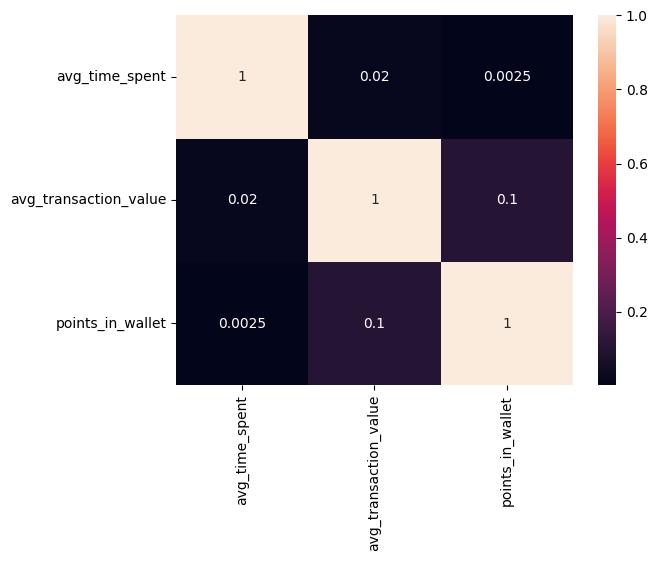

In [26]:
'''
continuous variables in the dataframe^^

avg_time_spent           
avg_transaction_value    
points_in_wallet         
'''

df_only_conts = pd.DataFrame()
df_only_conts.loc[:,"avg_time_spent"] = df.loc[:,"avg_time_spent"]
df_only_conts.loc[:,"avg_transaction_value"] = df.loc[:,"avg_transaction_value"]
df_only_conts.loc[:,"points_in_wallet"] = df.loc[:,"points_in_wallet"]


sns.heatmap(df_only_conts.corr(),annot=True)

#No correlation among the continuous variables 

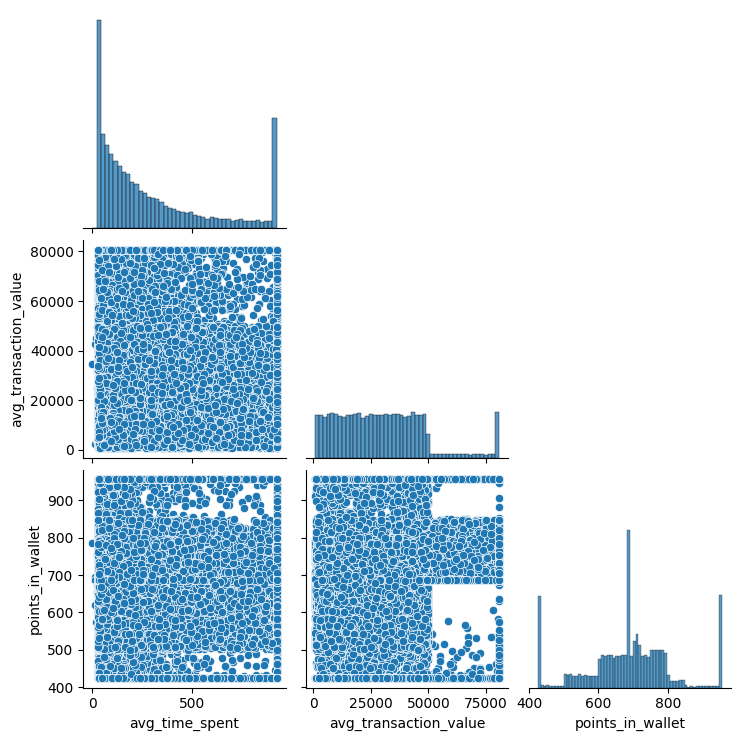

In [27]:
sns.pairplot(df_only_conts, corner = True)
#seems like a lot of users have around 650-700 points, they may be given these if they're a certain membership or a gift for signing up

In [28]:
#going back to see if any of the variables share a relationship with churn risk score 

#cont variables 


#ATS_ATV_CRS_scatter = px.scatter(df,x = "avg_time_spent", y = "avg_transaction_value", facet_col = "churn_risk_score")
#ATS_ATV_CRS_scatter.show()

#ATS_PIW_CRS_scatter = px.scatter(df, x = "avg_time_spent", y = "points_in_wallet", facet_col = "churn_risk_score")
#ATS_PIW_CRS_scatter.show()

#ATV_PIW_CRS_scatter = px.scatter(df,x = "avg_transaction_value", y = "points_in_wallet", facet_col = "churn_risk_score")
#ATV_PIW_CRS_scatter.show()


#Key Takeaways 
#Seems like users are capped with their transaction value when their churn risk score is higher 
#Seems like users are given a base number of points in wallet, they could be getting these points rewards from the site but it seems like if they let the rewards sit they're likely to have left

In [29]:
#going back to see if any of the variables share a relationship with churn risk score 

#disc variables 

#MC_CRS_hist = px.histogram(df, x = "membership_category", facet_col = "churn_risk_score", histnorm="percent")
#MC_CRS_hist.show()
#membership category and churn risk score are related 

#RC_CRS_hist = px.histogram(df, x = "region_category", facet_col = "churn_risk_score", histnorm="percent")
#RC_CRS_hist
#region category and churn risk score are related 

#JTR_CRS_hist = px.histogram(df, x = "joined_through_referral", facet_col = "churn_risk_score", histnorm="percent")
#JTR_CRS_hist.show()
#joining through referrals and churn risk score are related 

#OAP_CRS_hist = px.histogram(df, x = "offer_application_preference", facet_col = "churn_risk_score", histnorm = "percent")
#OAP_CRS_hist.show()
#preferred offers and churn risk score are related 

#PC_CRS_hist = px.histogram(df, x = "past_complaint", facet_col = "churn_risk_score", histnorm="percent")
#PC_CRS_hist.show()
#Past complaints and churn risk score are related 

#CS_CRS_hist = px.histogram(df, x = "complaint_status", facet_col = "churn_risk_score", histnorm="percent")
#CS_CRS_hist.show()
#Complaint status and churn risk score are related 

#F_CRS_hist = px.histogram(df, x = "feedback", facet_col = "churn_risk_score", histnorm="percent")
#F_CRS_hist.show() 
#feedback and churn risk score are related 

#avg_freq_log_days_hist = px.histogram(df, x = "avg_frequency_login_days", facet_col = "churn_risk_score", nbins= 20, histnorm = "percent")
#avg_freq_log_days_hist.show()


In [30]:
#Key Takeaways 
'''
Variables that share a relationship with churn risk score:

***categorical***
- membership_category
- region_category
- joined_through_referral
- offer_application_preference
- past_complaint
- complaint_status 
- feedback 
- avg_frequency_login_days

***numerical***
- age 
- avg_time_spent           
- avg_transaction_value    
- points_in_wallet      
- churn_risk_score  
- days_since_last_login 
'''

'\nVariables that share a relationship with churn risk score:\n\n***categorical***\n- membership_category\n- region_category\n- joined_through_referral\n- offer_application_preference\n- past_complaint\n- complaint_status \n- feedback \n- avg_frequency_login_days\n\n***numerical***\n- age \n- avg_time_spent           \n- avg_transaction_value    \n- points_in_wallet      \n- churn_risk_score  \n- days_since_last_login \n'

In [31]:
def discover_categorical_and_numerical(df):
  type_dictionary = {col: ("categorical" if df[col].dtype == "O" else "numerical") for col in df.columns}
  categorical = [key for key, val in type_dictionary.items() if val == "categorical"]
  numerical = df.columns.difference(categorical)
  return categorical, numerical

categorical, numerical = discover_categorical_and_numerical(df)

In [32]:
#Dropping unnecessary variables 
df_final = df.drop(['Name','customer_id','security_no','referral_id','joining_date','last_visit_time'],axis = 1)
categorical, numerical
df_final.dtypes

age                                    float64
gender                                  object
region_category                         object
membership_category                     object
joined_through_referral                 object
preferred_offer_types                   object
medium_of_operation                     object
internet_option                         object
days_since_last_login                  float64
avg_time_spent                         float64
avg_transaction_value                  float64
avg_frequency_login_days               float64
points_in_wallet                       float64
used_special_discount                   object
offer_application_preference            object
past_complaint                          object
complaint_status                        object
feedback                                object
churn_risk_score                string[python]
dtype: object

In [33]:
df_categoricals = ['gender',
 'joined_through_referral',
 'used_special_discount',
 'offer_application_preference',
 'past_complaint',
 'region_category',
 'membership_category',
 'preferred_offer_types',
 'medium_of_operation',
 'internet_option',
 'complaint_status',
 'feedback']

df_numericals = ['age', 'avg_frequency_login_days', 'avg_time_spent',
        'avg_transaction_value', 'days_since_last_login',
        'points_in_wallet']


df_other_categoricals = ['region_category',
 'membership_category',
 'preferred_offer_types',
 'medium_of_operation',
 'internet_option',
 'complaint_status',
 'feedback']

In [34]:
df_categoricals 

['gender',
 'joined_through_referral',
 'used_special_discount',
 'offer_application_preference',
 'past_complaint',
 'region_category',
 'membership_category',
 'preferred_offer_types',
 'medium_of_operation',
 'internet_option',
 'complaint_status',
 'feedback']

In [35]:
df_other_categoricals

['region_category',
 'membership_category',
 'preferred_offer_types',
 'medium_of_operation',
 'internet_option',
 'complaint_status',
 'feedback']

In [36]:
def frequency_encoding(df, columns):
  list_freq_dict = {}
  for c in columns:
    freq_dict = df.groupby([c]).size().to_dict()
    df[f"per_{c}"] = df[c].map(freq_dict)
    list_freq_dict[c] = freq_dict
  return df, list_freq_dict

def probability_encoding(df, columns):
  list_freq_dict = {}
  for c in columns:
    freq_dict = df.groupby([c]).size().to_dict() 

    for i in freq_dict:
      freq_dict[i] = freq_dict[i] / df.shape[0]

    df[f"per_{c}"] = df[c].map(freq_dict)
    list_freq_dict[c] = freq_dict

  return df, list_freq_dict


df_final, list_freq = probability_encoding(df_final,df_categoricals)

list_freq



{'gender': {'F': 0.5003702560937983,
  'M': 0.497994446158593,
  'Unknown': 0.0016352977476087626},
 'joined_through_referral': {'': 0.14770132675100278,
  'No': 0.4283245911755631,
  'Yes': 0.4239740820734341},
 'used_special_discount': {'No': 0.45013884603517434,
  'Yes': 0.5498611539648257},
 'offer_application_preference': {'No': 0.4470842332613391,
  'Yes': 0.5529157667386609},
 'past_complaint': {'No': 0.5030546127738352, 'Yes': 0.49694538722616477},
 'region_category': {'City': 0.3451095340944153,
  'Town': 0.3809318111693922,
  'Unknown': 0.14677568651650724,
  'Village': 0.12718296821968528},
 'membership_category': {'Basic Membership': 0.20796050601666152,
  'Gold Membership': 0.18309163838321504,
  'No Membership': 0.20867016352977477,
  'Platinum Membership': 0.11743289108299908,
  'Premium Membership': 0.11983955569268744,
  'Silver Membership': 0.16300524529466215},
 'preferred_offer_types': {'Credit/Debit Card Offers': 0.33107065720456647,
  'Gift Vouchers/Coupons': 0.33

In [37]:
import json

# create json save function

with open("frequency_encoding.json", "w") as outfile:
    json.dump(list_freq, outfile)


In [38]:
#encode categorical variables and apply to the model 
categorical, numerical 

(['customer_id',
  'Name',
  'gender',
  'security_no',
  'region_category',
  'membership_category',
  'joining_date',
  'joined_through_referral',
  'referral_id',
  'preferred_offer_types',
  'medium_of_operation',
  'internet_option',
  'last_visit_time',
  'used_special_discount',
  'offer_application_preference',
  'past_complaint',
  'complaint_status',
  'feedback'],
 Index(['age', 'avg_frequency_login_days', 'avg_time_spent',
        'avg_transaction_value', 'churn_risk_score', 'days_since_last_login',
        'points_in_wallet'],
       dtype='object'))

In [39]:
# set up the pipeline
from sklearn.pipeline import Pipeline as pipe

from feature_engine.encoding import (
    MeanEncoder,
    OneHotEncoder,
    CountFrequencyEncoder,
    RareLabelEncoder
)

from sklearn.pipeline import Pipeline as pipe


# set up the pipeline

fe_pipe = pipe([
    # encode categorical and discrete variables using the target mean
    ('categorical_encoder', MeanEncoder(variables=df_other_categoricals, smoothing="auto", unseen='encode', missing_values='ignore')),
    ('onehot_encoder', OneHotEncoder(top_categories=3,
                                     variables=["gender", "joined_through_referral",
                                                "used_special_discount", "offer_application_preference",
                                                "past_complaint"],
                                     drop_last=True))
  ])



In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, average_precision_score
from sklearn.model_selection import RandomizedSearchCV

#preparing data 
def copy_df(df, cols):
    newdf = pd.DataFrame()
    for c in cols:
        newdf.loc[:,c] = df.loc[:,c]
    return newdf

x = df_final.drop("churn_risk_score",axis = 1)
y = df_final["churn_risk_score"].astype("int")

#training the data 
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.25,train_size = .75, random_state = 42)

x_train_categorical = x_train[df_categoricals]
x_test_categorical = x_test[df_categoricals]

x_train_numerical = x_train[df_numericals]
x_test_numerical = x_test[df_numericals]



In [41]:
fe_pipe.fit(x_train_categorical,y_train)

Pipeline(steps=[('categorical_encoder',
                 MeanEncoder(missing_values='ignore', smoothing='auto',
                             unseen='encode',
                             variables=['region_category',
                                        'membership_category',
                                        'preferred_offer_types',
                                        'medium_of_operation',
                                        'internet_option', 'complaint_status',
                                        'feedback'])),
                ('onehot_encoder',
                 OneHotEncoder(drop_last=True, top_categories=3,
                               variables=['gender', 'joined_through_referral',
                                          'used_special_discount',
                                          'offer_application_preference',
                                          'past_complaint']))])

In [42]:
transformed_x_train_categorical = fe_pipe.transform(x_train_categorical)
x_train = pd.concat([x_train_numerical,transformed_x_train_categorical], axis = 1)
transformed_x_test_categorical = fe_pipe.transform(x_test_categorical)
x_test = pd.concat([x_test_numerical,transformed_x_test_categorical], axis = 1)


In [43]:
#creating the decision tree classifier 
RF_classifier = RandomForestClassifier(n_estimators = 1600, min_samples_split = 2, min_samples_leaf = 2, max_features = None, max_depth = 10, bootstrap = True, n_jobs = -1, random_state = 42)
RF_classifier.fit(x_train,y_train)

{'n_estimators': 2000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': None,
 'max_depth': 10,
 'bootstrap': True}

#creating y-predicted and printing the classification report 
y_pred = RF_classifier.predict(x_test)
print(classification_report(y_test,y_pred))

#Pretty bad if we're focusing on precision 
#Still need to feature encode 
#Evaluation Metric: Recall, precision or possibly f1 score 

              precision    recall  f1-score   support

           1       0.70      0.93      0.80       599
           2       0.90      0.61      0.73       609
           3       0.91      0.91      0.91      2415
           4       0.77      0.50      0.61      2267
           5       0.70      0.94      0.80      2213

    accuracy                           0.78      8103
   macro avg       0.80      0.78      0.77      8103
weighted avg       0.80      0.78      0.77      8103



In [44]:
def plot_confusion_matrix(cm, labels):
    """
    Plots a confusion matrix using seaborn with annotations and a green color map.

    Args:
    cm (numpy.ndarray): The confusion matrix to plot.
    labels (list of str): The labels for the confusion matrix axes.
    """
    # Create the heatmap
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', xticklabels=labels, yticklabels=labels)

    # Add labels and title for clarity
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')

    # Show the plot
    plt.show()

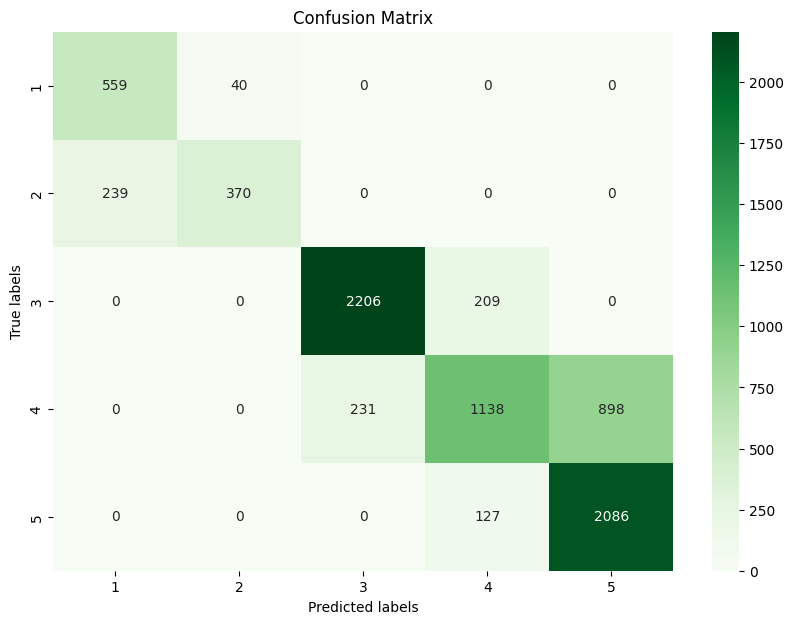

In [45]:
confusion_mat = confusion_matrix(y_test,y_pred)
plot_confusion_matrix(confusion_mat,[1,2,3,4,5])

In [46]:
from pprint import pprint
#pprint(RF_classifier.get_params())


max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
random_grid = {'n_estimators' : [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
               'max_features' : ['sqrt', 'log2', None],
               'max_depth' : max_depth,
               'min_samples_split' : [2, 5, 10],
               'min_samples_leaf' : [1, 2, 4],
               'bootstrap' : [True, False]}

RF_random = RandomizedSearchCV(estimator = RF_classifier, param_distributions = random_grid,
                               n_iter = 100, cv = 3, verbose = 0, random_state = 42, n_jobs = -1)

#Needs train labels and train features, not the values itself (ie y_test/y_pred)
RF_random.fit(x_train,y_train)

pprint(RF_random.get_params())

KeyboardInterrupt: 

In [ ]:
RF_random.best_params_

'''
best params for 20 
{'n_estimators': 200,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'log2',
 'max_depth': 10,
 'bootstrap': True}
 '''
#Need to try higher n_iter's and then add to model if its better 

'''
best params for 50 
{'n_estimators': 2000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': None,
 'max_depth': 10,
 'bootstrap': True}
'''


'''
best params for 100
{'n_estimators': 1600,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': None,
 'max_depth': 10,
 'bootstrap': True}
'''

{'n_estimators': 1600,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': None,
 'max_depth': 10,
 'bootstrap': True}